Cluster 20 is a first cluster number whose derivative between `i-1` and `i` number of patches is converged less than 3% at 1500K patch training.

In [1]:
import os
import sys
import glob
import numpy as np
import tensorflow as tf
import matplotlib
import matplotlib.pyplot as plt
 
## score
#from sklearn.metrics import adjusted_mutual_info_score as ami
from sklearn.metrics import silhouette_score as sil

In [18]:
from matplotlib import patches as mpl_patches

In [12]:
sys.path.insert(1, os.path.join(sys.path[0],"/home/tkurihana/scratch-midway2/data/MOD06/" ) )
from analysis_lib import _get_swath, _load_tif_data
from analysis_lib import _get_colors, _gen_patches, _anl_agl
from analysis_lib import cluster_plotting2, _cluster_plotting

#### Settings: load data & gen patches

In [10]:
datadir = '/home/tkurihana/scratch-midway2/anl/output_2000_2018_prediction'

In [5]:
tifdir='/home/tkurihana/scratch-midway2/data/GEE/clouds_gee_2015_2016'
tifname='2015-06-28_MOD09GA_background_removal_zero_inputated_image_with_cf_10perc_grid_size10-0000017664-0000070656.tif'

In [6]:
swath1 = _get_swath(tifdir, tifname)

 Shape  (9054, 9496, 7)


In [7]:
SHAPE = 128, 128, 7

In [8]:
patches = _gen_patches(swath1, normalization=True)

#### model load

In [28]:
# encoder part
model_dir='/home/tkurihana/clouds/output/m9-22_oceans/'
ENCODER_DEF=model_dir+'encoder.json'
ENCODER_WEIGHTS=model_dir+'encoder.h5'
with open(ENCODER_DEF,"r") as f:
    encoder_m22 = tf.keras.models.model_from_json(f.read())
encoder_m22.load_weights(ENCODER_WEIGHTS)

/home/tkurihana/.conda/envs/tf-cpu/lib/python3.6/site-packages/tensorflow/python/keras/layers/core.py:791: UserWarning: models is not loaded, but a Lambda layer uses it. It may cause errors.
  , UserWarning)


### N_Cluster = 20, K=5

In [9]:
n_cluster = 20
colors = _get_colors(n=n_cluster)

In [33]:
knn_label = np.load(datadir+'/knn_label_spark_p-1500.0-nc20_m22_agu-key2015-06-28-ID1.npy')

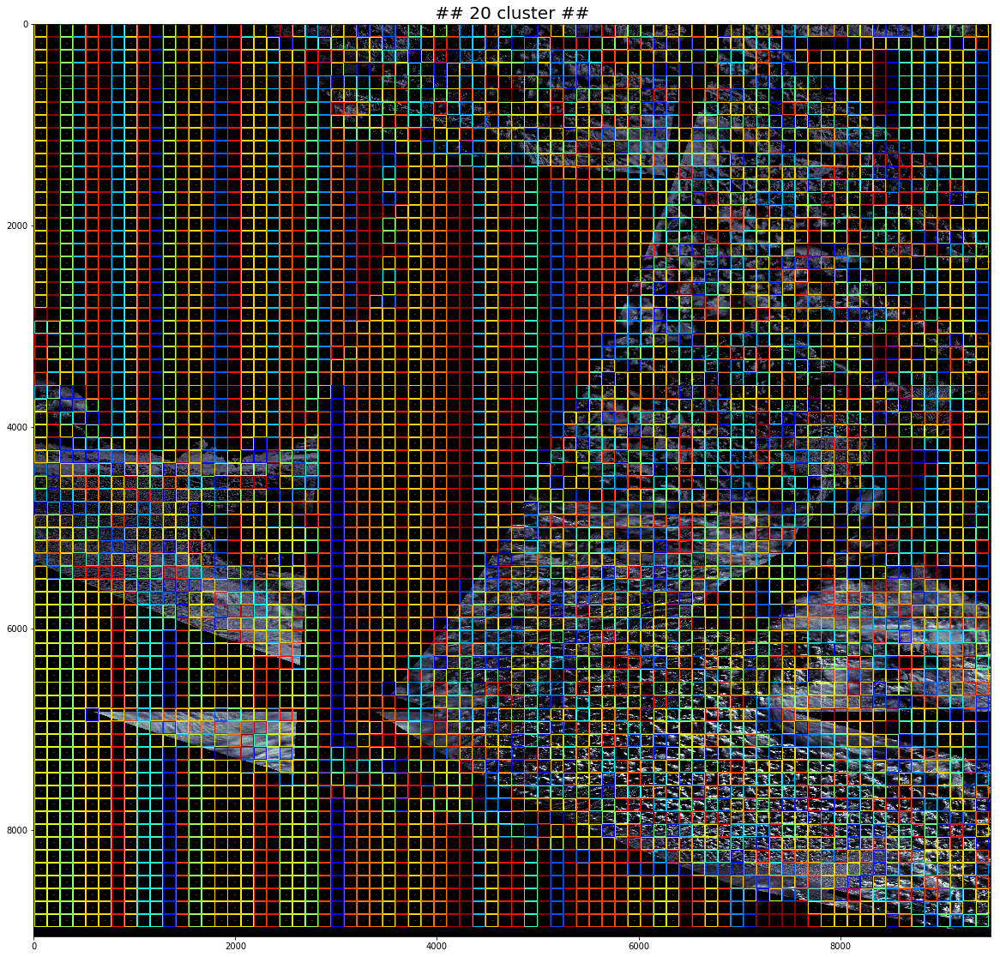

In [13]:
knn_label = np.load(datadir+'/knn_label_spark_p-1500.0-nc20_m22_agu-key2015-06-28-ID1.npy')
_cluster_plotting(swath1, patches, knn_label, SHAPE, colors, ncluster=n_cluster)

#### plotting each

In [25]:
def eplotting(swath,
              patches,
              patches_labels1,
              SHAPE, 
              colors, ncluster=0,
              target_cluster=0
             ):
    """ 
    """
    line_width = 2
    fig = plt.figure(figsize=(6,6))
    
    # m22
    ax1 = plt.subplot(111)
    plt.imshow(swath[:,:,0], cmap="bone")
    rects = []
    for i in range(patches.shape[0]):
        for j in range(patches.shape[1]):
            if patches_labels1[i,j] == target_cluster:
                ax1.add_patch(mpl_patches.Rectangle(
                 (j * SHAPE[0] + line_width , i * SHAPE[1] + line_width ),
                 width=SHAPE[0] - line_width * 2,
                 height=SHAPE[1] - line_width * 2,
                 linewidth=2,
                 edgecolor=colors[patches_labels1[i,j]],
                 facecolor="none"
                 ))
                centerx = SHAPE[0]*0.5*(2*j+1) #+1
                centery = SHAPE[1]*0.5*(2*i+1) #+1
                # add label as text
                plt.text(centerx, centery, str(patches_labels1[i,j]),
                    fontsize=1,weight='bold',
                    color=colors[patches_labels1[i,j]])
    ax1.set_title(" ## m22 - %d/%d cluster ## " %((target_cluster+1), ncluster), fontsize=14)    
    plt.show()

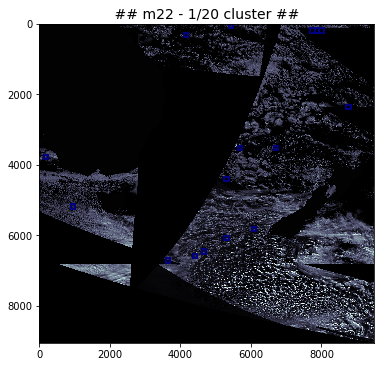

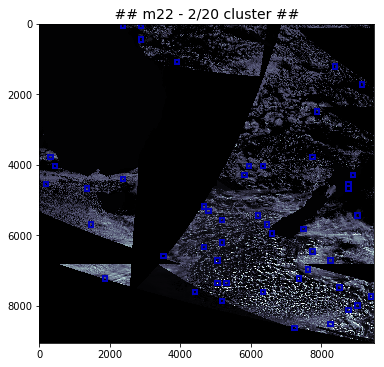

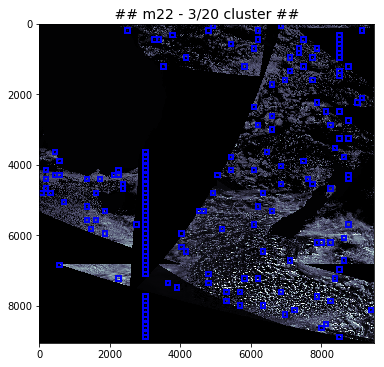

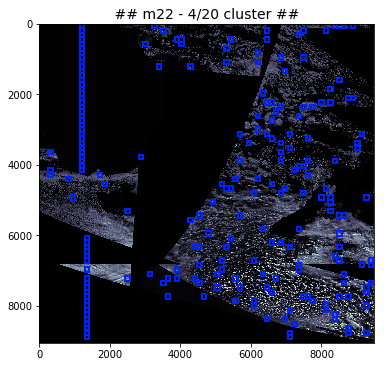

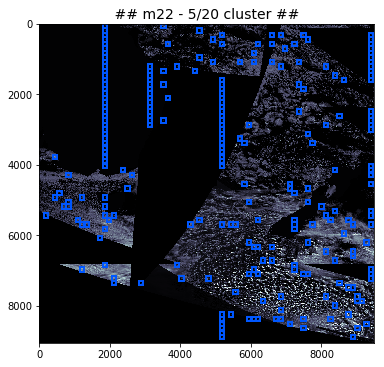

...

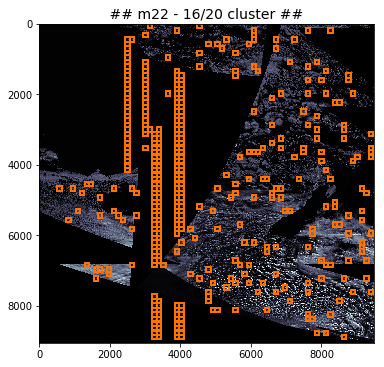

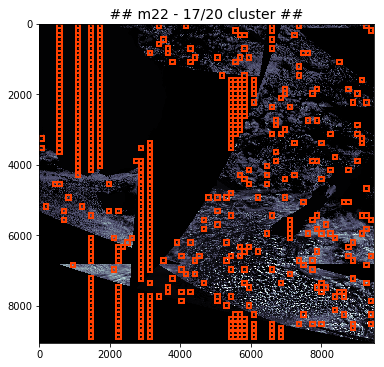

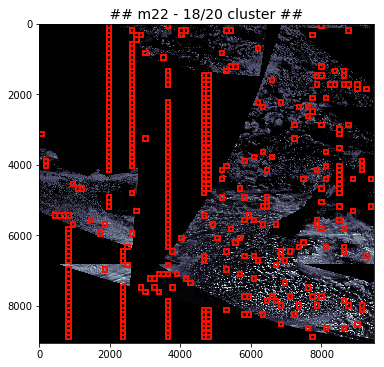

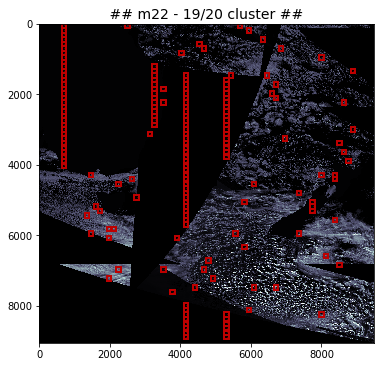

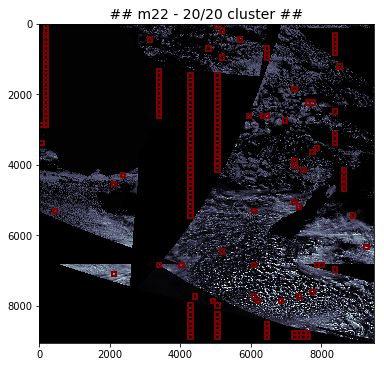

In [26]:
for itcluster in range(n_cluster):
    eplotting(swath1, patches, knn_label, 
          SHAPE, colors, ncluster=n_cluster, target_cluster=itcluster)

### sil score

In [30]:
encs = encoder_m22.predict(patches.reshape((-1,128,128,7)))

In [31]:
encs_mean = encs.mean(axis=(1,2))

In [34]:
sil(encs_mean, labels=knn_label.flatten(), metric='euclidean')

-0.35186028

negative values indicate that those samples might have been assigned to the wrong cluster.

### N_cluster = 20, k=10

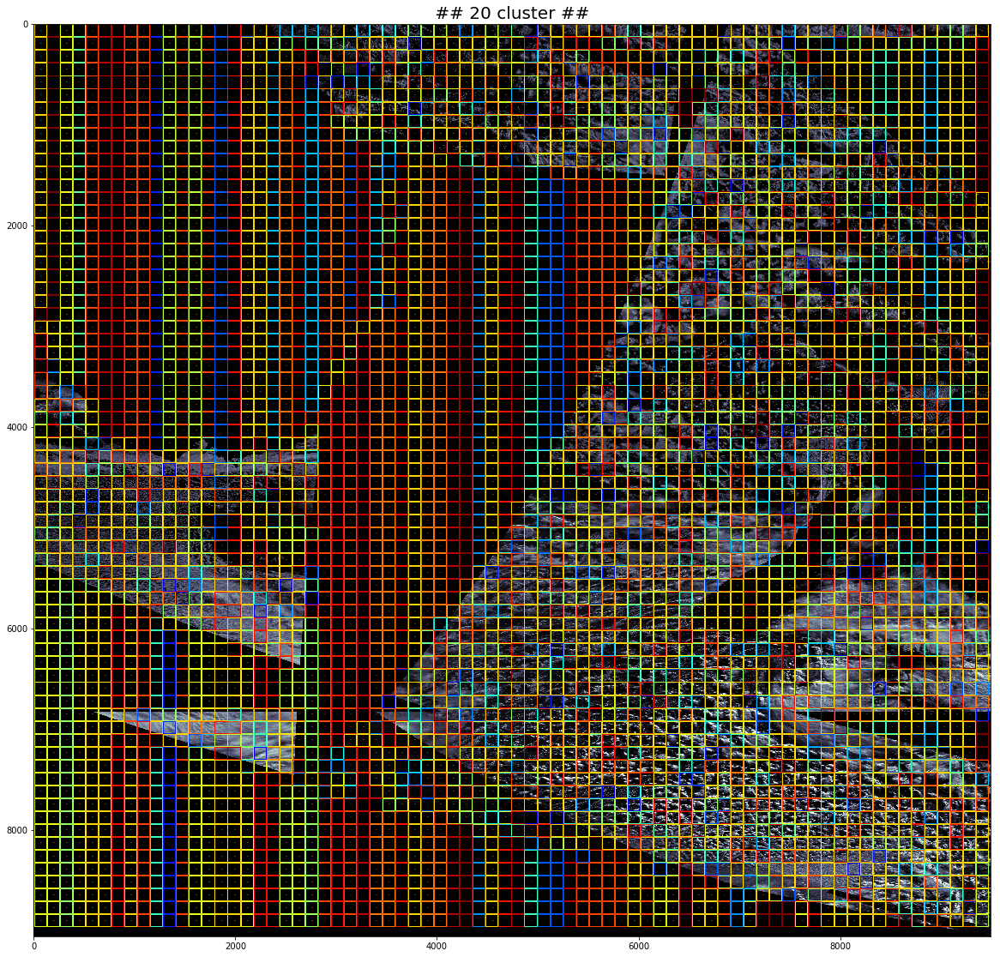

In [27]:
## knn_label_spark_p-1500.0-nc20_m22_agu_k-10-key2015-06-28-ID1.npy
knn_label = np.load(datadir+'/knn_label_spark_p-1500.0-nc20_m22_agu_k-10-key2015-06-28-ID1.npy')
_cluster_plotting(swath1, patches, knn_label, SHAPE, colors, ncluster=n_cluster)

In [32]:
sil(encs_mean, labels=knn_label.flatten(), metric='euclidean')

-0.39115676

### N_Cluster = 20, k= 20

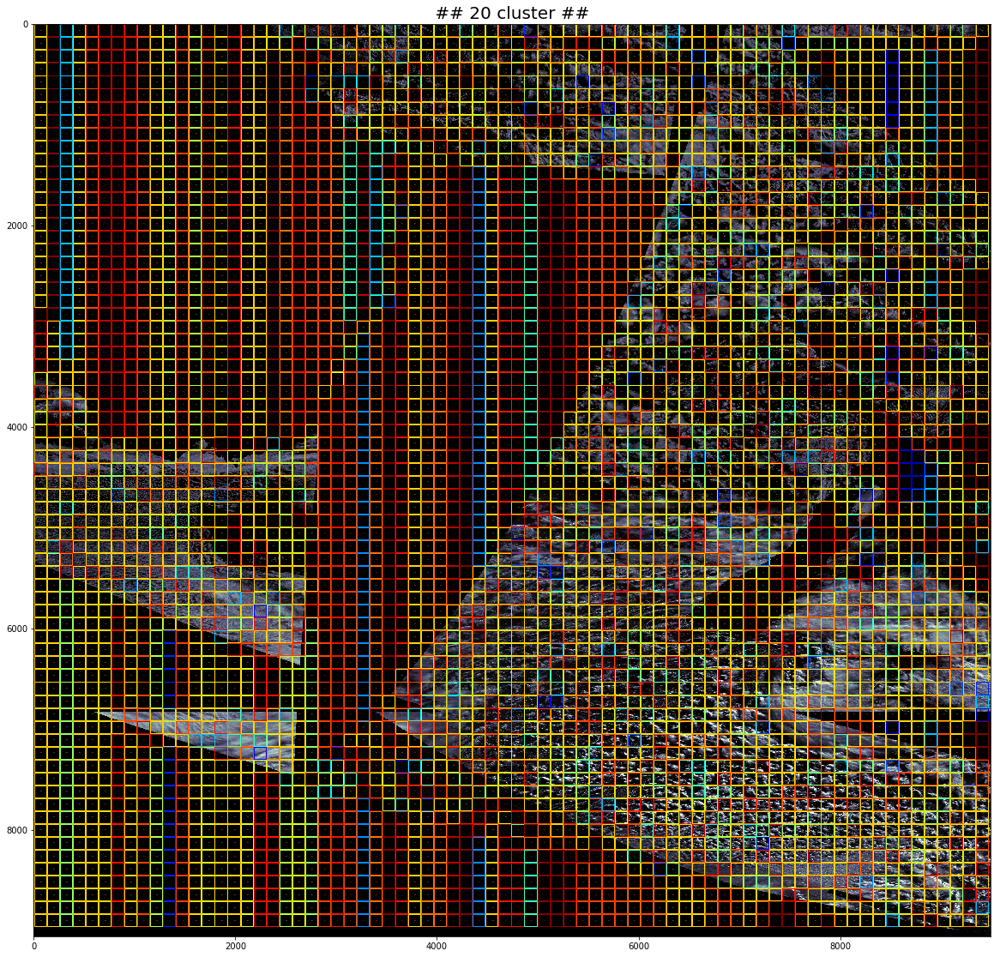

In [35]:
## knn_label_spark_p-1500.0-nc20_m22_agu_k-10-key2015-06-28-ID1.npy
knn_label = np.load(datadir+'/knn_label_spark_p-1500.0-nc20_m22_agu_k-20-key2015-06-28-ID1.npy')
_cluster_plotting(swath1, patches, knn_label, SHAPE, colors, ncluster=n_cluster)

In [36]:
sil(encs_mean, labels=knn_label.flatten(), metric='euclidean')

-0.47985214

### N_Cluster = 20, k = 30

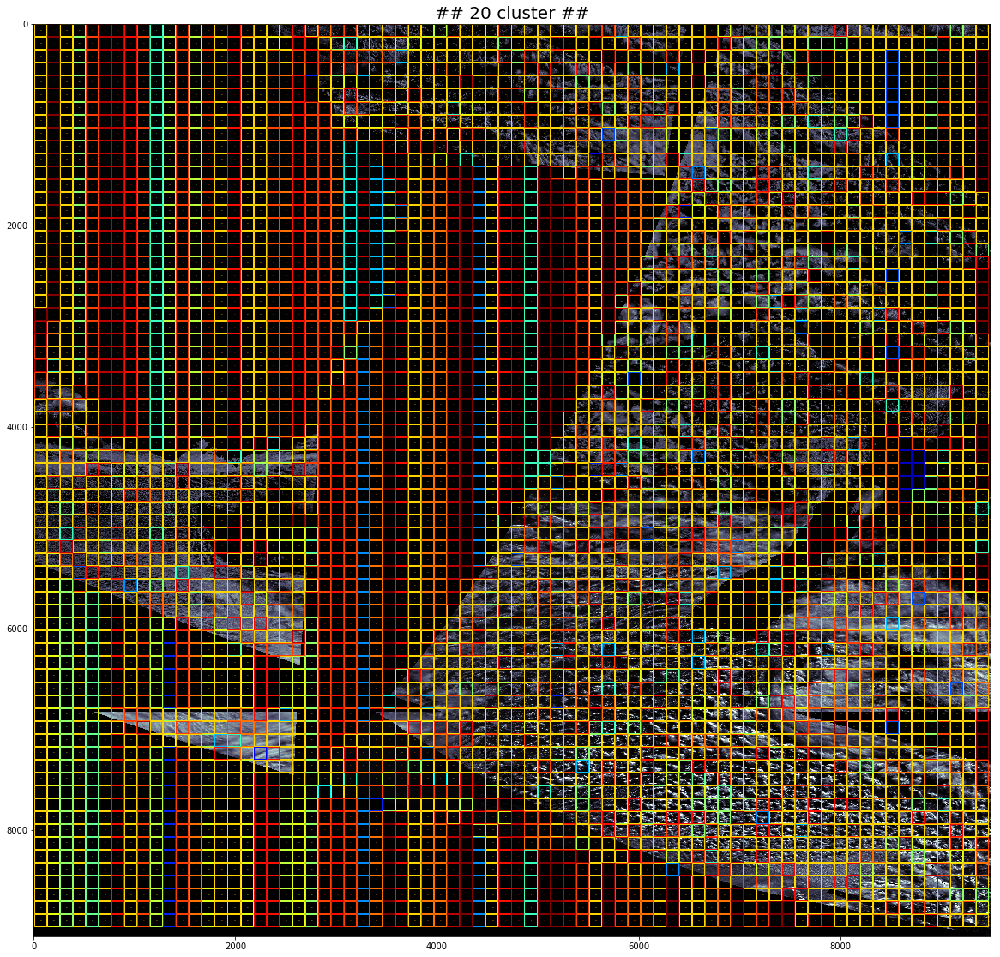

In [37]:
knn_label = np.load(datadir+'/knn_label_spark_p-1500.0-nc20_m22_agu_k-30-key2015-06-28-ID1.npy')
_cluster_plotting(swath1, patches, knn_label, SHAPE, colors, ncluster=n_cluster)

In [38]:
sil(encs_mean, labels=knn_label.flatten(), metric='euclidean')

-0.5073993

### N_Cluster = 20, k = 40

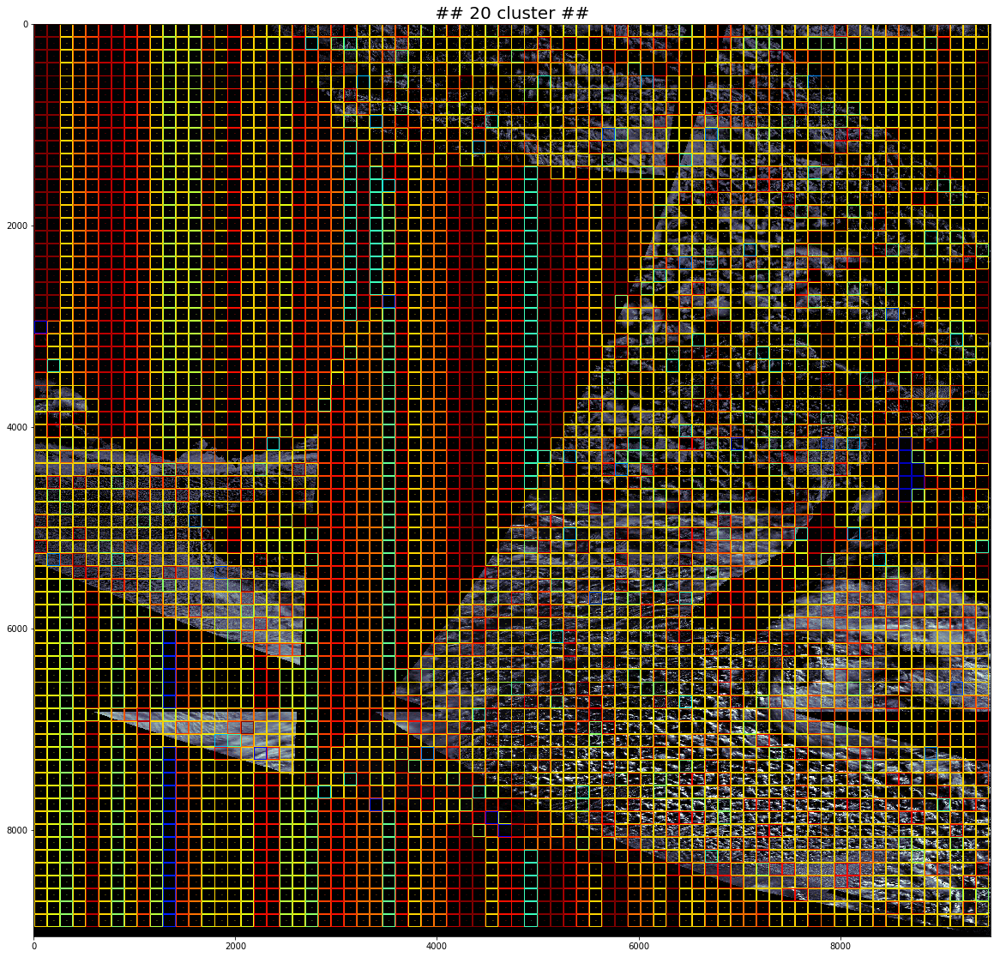

In [39]:
knn_label = np.load(datadir+'/knn_label_spark_p-1500.0-nc20_m22_agu_k-40-key2015-06-28-ID1.npy')
_cluster_plotting(swath1, patches, knn_label, SHAPE, colors, ncluster=n_cluster)

In [40]:
sil(encs_mean, labels=knn_label.flatten(), metric='euclidean')

-0.6661032

### N_Cluster = 20, k = 50

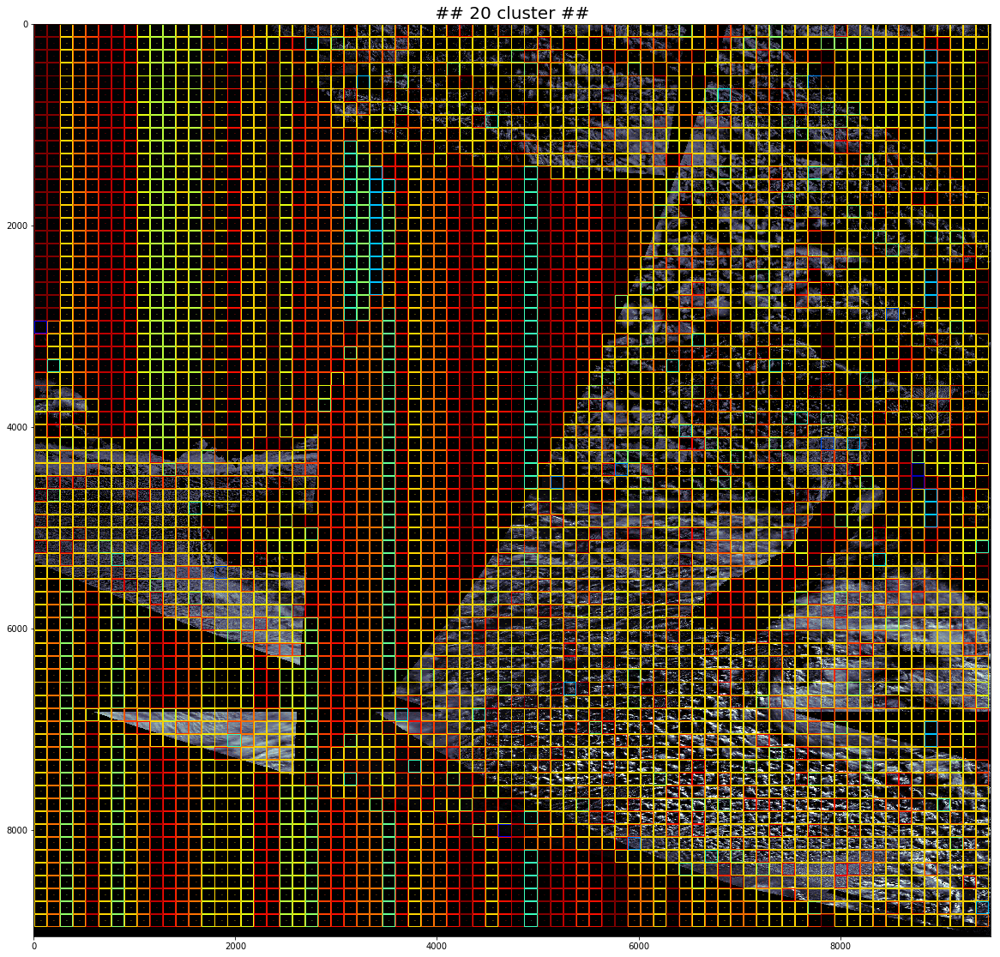

In [41]:
knn_label = np.load(datadir+'/knn_label_spark_p-1500.0-nc20_m22_agu_k-50-key2015-06-28-ID1.npy')
_cluster_plotting(swath1, patches, knn_label, SHAPE, colors, ncluster=n_cluster)

In [42]:
sil(encs_mean, labels=knn_label.flatten(), metric='euclidean')

-0.6611232

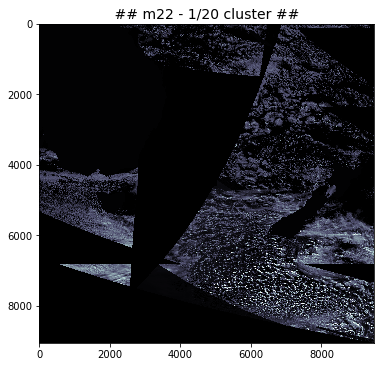

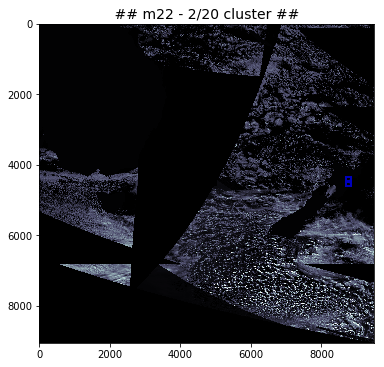

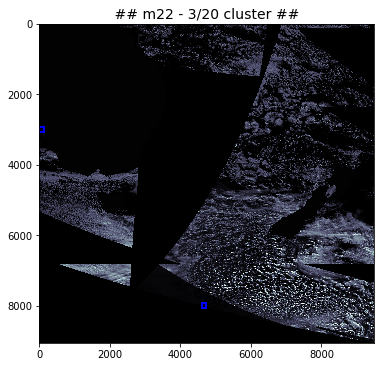

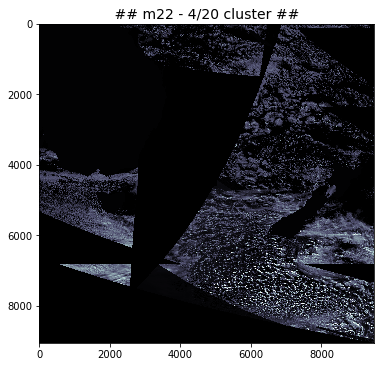

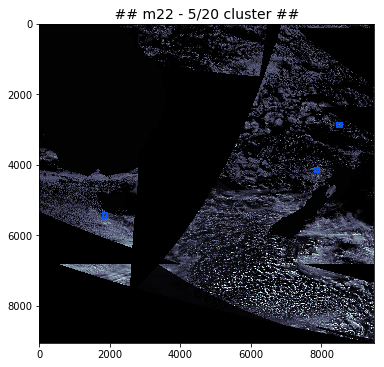

...

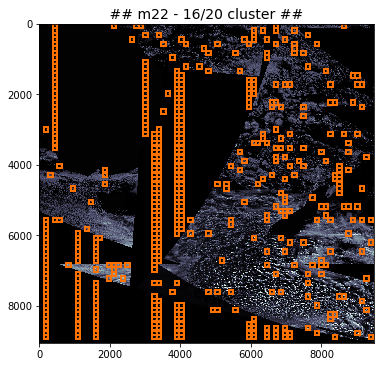

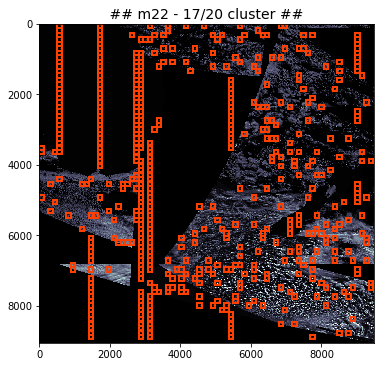

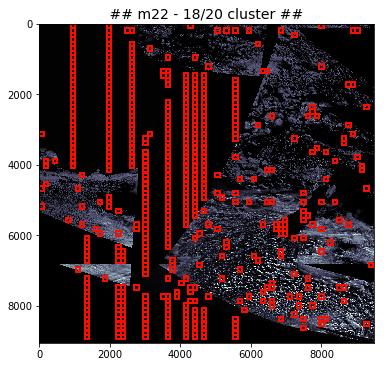

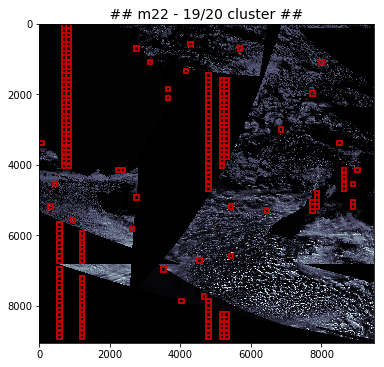

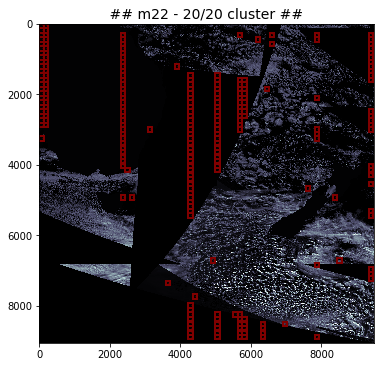

In [43]:
for itcluster in range(n_cluster):
    eplotting(swath1, patches, knn_label, 
          SHAPE, colors, ncluster=n_cluster, target_cluster=itcluster)

try no-background again?